In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from mealpy.optimizer import Optimizer
from scipy.io import arff
from mealpy import FloatVar
from math import gamma

In [2]:
df = pd.read_csv(r'output\embeddings\ConvE_10_with_fr.csv')

# manually match the names
matches = {
    "ABGSHIP": "ABG Shipyard Limited",
    "ADHUNIK": "Adhunik Metaliks Limited",
    "ANGIND": "ANG Industries Limited",
    "ASHAPURMIN": "Ashapura Minechem Limited",
    "BAFNAPH": "Bafna Pharmaceuticals Limited",
    "BHUSANSTL": "Bhushan Steel Limited",
    "CANDC": "C & C Constructions Limited",
    "EASUNREYRL": "Easun Reyrolle Limited",
    "EDL": "Empee Distilleries Limited",
    "GALLANT": "Gallantt Ispat Ltd",
    "GEMINI": "Gemini Communication Limited",
    "GUJNRECOKE": "Gujarat NRE Coke Limited",
    "INDOSOLAR": "Indosolar Limited",
    "IVRCLINFRA": "IVRCL Limited",
    "JAIHINDPRO": "Jaihind Projects Limited",
    "JENSONICOL": "Jenson & Nicholson (India) Limited",
    "JPINFRATEC": "Jaypee Infratech Limited",
    "KWALITY": "kwality limited",
    "ADVENZYM": "Advanced Enzyme Tech Ltd.",
    "AFFLE": "Affle (India) Ltd.",
    "ALEMBICLTD": "Alembic Pharmaceuticals Ltd.",
    "AMARAJABAT": "Amara Raja Batteries Ltd.",
    "ASTERDM": "Aster DM Healthcare Ltd.",
    "AVANTIFEED": "Avanti Feeds Ltd.",
    "BALRAMCHIN": "Balrampur Chini Mills Ltd.",
    "CEATLTD": "Ceat Ltd."
}

df

,Unnamed: 0,Folder_name,Feature_name,x1,x2,x3,x4,x5,x6,x7,...,k8,k9,k10,Open,High,Low,Close,Prev. Close,Change,% Change
0,0,ABG Shipyard Limited,2013,0.95,0.40,0.003346,2.27,0.707756,0.017817,18.88,...,3.331443,0.0,3.539602,19.204890,20.043685,18.323994,19.321036,19.295528,0.025458,0.265418
1,4,ANG Industries Limited,2013,1.14,0.51,0.060725,1.53,0.523116,0.138180,51.51,...,3.897995,0.0,3.638812,19.204890,20.043685,18.323994,19.321036,19.295528,0.025458,0.265418
2,5,ANG Industries Limited,2015,1.08,0.49,0.037860,1.72,0.562869,0.151222,51.31,...,2.369548,0.0,2.675434,17.999170,18.787287,16.485577,18.010405,18.001943,0.008623,0.242227
3,6,ANG Industries Limited,2016,0.96,0.41,0.020800,1.77,0.601283,0.147791,58.66,...,3.116590,0.0,3.773186,15.342440,15.849919,14.075262,15.325655,15.342440,-0.016573,-0.024677
4,7,ANG Industries Limited,2017,0.31,0.17,0.004391,-2.81,1.076724,0.164016,56.30,...,3.647412,0.0,4.323845,12.948232,13.488902,11.567490,12.961799,12.948232,0.013740,0.197033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,46,Jaypee Infratech Limited,2020,0.70,0.08,0.006177,-4.37,0.776451,0.127856,7.84,...,3.670827,0.0,3.562300,25.511968,26.398444,23.216697,25.516386,25.699317,-0.183574,-0.352289
90,47,Jaypee Infratech Limited,2021,0.63,0.08,0.014797,-1.72,0.877271,0.128827,3.30,...,3.982584,0.0,3.381750,17.841734,18.662440,16.379446,17.841391,17.841734,-0.000363,0.163992
91,41,Jenson & Nicholson (India) Limited,2016,0.03,0.02,0.006709,-0.23,23.069427,1.188889,240.19,...,2.130456,0.0,2.874489,15.342440,15.849919,14.075262,15.325655,15.342440,-0.016573,-0.024677
92,42,Jenson & Nicholson (India) Limited,2017,0.01,0.01,0.002659,-0.22,34.559140,1.213938,74.81,...,3.347911,0.0,3.853860,12.948232,13.488902,11.567490,12.961799,12.948232,0.013740,0.197033


In [3]:
df.columns

Index(['Unnamed: 0', 'Folder_name', 'Feature_name', 'x1', 'x2', 'x3', 'x4',
       'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'x14', 'x15',
       'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24', 'x25',
       'x26', 'x27', 'x28', 'x29', 'x30', 'x31', 'x32', 'x33', 'x34', 'x35',
       'x36', 'x37', 'x38', 'x39', 'x40', 'x41', 'x42', 'x43', 'x44', 'x45',
       'x46', 'x47', 'x48', 'x49', 'x50', 'x51', 'x52', 'x53', 'x54', 'x55',
       'x56', 'x57', 'x58', 'x59', 'x60', 'x61', 'x62', 'x63', 'x64', 'x65',
       'x66', 'Label', 'Bankruptcy', 'path', 'k1', 'k2', 'k3', 'k4', 'k5',
       'k6', 'k7', 'k8', 'k9', 'k10', 'Open ', 'High ', 'Low ', 'Close ',
       'Prev. Close ', 'Change ', '% Change '],
      dtype='object')

In [4]:
drop_col = ['Unnamed: 0', 'Label', 'Bankruptcy', 'Folder_name', 'Feature_name', 'path']
df = df.sort_values(by=["Folder_name", "Feature_name"])
df.dropna(inplace=True)
X = df.drop(drop_col, axis=1)
y = df['Label']

In [5]:
print('original feature len', len(df.columns))
print('original features', (df.columns))
print(df.head())

original feature len 89
original features Index(['Unnamed: 0', 'Folder_name', 'Feature_name', 'x1', 'x2', 'x3', 'x4',
       'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'x14', 'x15',
       'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24', 'x25',
       'x26', 'x27', 'x28', 'x29', 'x30', 'x31', 'x32', 'x33', 'x34', 'x35',
       'x36', 'x37', 'x38', 'x39', 'x40', 'x41', 'x42', 'x43', 'x44', 'x45',
       'x46', 'x47', 'x48', 'x49', 'x50', 'x51', 'x52', 'x53', 'x54', 'x55',
       'x56', 'x57', 'x58', 'x59', 'x60', 'x61', 'x62', 'x63', 'x64', 'x65',
       'x66', 'Label', 'Bankruptcy', 'path', 'k1', 'k2', 'k3', 'k4', 'k5',
       'k6', 'k7', 'k8', 'k9', 'k10', 'Open ', 'High ', 'Low ', 'Close ',
       'Prev. Close ', 'Change ', '% Change '],
      dtype='object')
   Unnamed: 0             Folder_name  Feature_name    x1    x2        x3  \
0           0    ABG Shipyard Limited          2013  0.95  0.40  0.003346   
1           4  ANG Industries Limited        

In [6]:
numeric_only = df.describe().columns
df.describe()

,Unnamed: 0,Feature_name,x1,x2,x3,x4,x5,x6,x7,x8,...,k8,k9,k10,Open,High,Low,Close,Prev. Close,Change,% Change
count,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,...,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000,94.000000
mean,48.712766,2018.489362,1.722979,1.175532,0.272789,6.462128,1.223905,0.167203,52.929255,6.011116,...,1.634810,1.448114,1.776176,17.111229,17.825825,15.610730,17.137938,17.138194,-0.000232,0.122708
std,28.812565,2.605803,1.863132,1.651056,0.763100,46.933882,4.295959,0.305868,53.157638,11.313087,...,1.657006,2.075770,1.785617,3.941243,4.094648,3.640952,3.955928,3.994483,0.095279,0.287046
min,0.000000,2012.000000,0.010000,0.010000,0.000045,-52.050000,0.005373,0.000836,0.000000,0.408903,...,0.000000,0.000000,0.000000,12.444787,12.918303,11.567490,12.444370,12.444787,-0.183574,-0.352289
25%,24.250000,2017.000000,0.722500,0.302500,0.008128,0.000000,0.240103,0.016408,6.820000,1.035058,...,0.000000,0.000000,0.000000,13.394924,13.924419,12.156342,13.407075,13.395811,-0.016573,-0.024677
50%,48.500000,2018.000000,1.155000,0.640000,0.037404,0.290000,0.362244,0.057861,43.840000,1.840619,...,2.127528,0.000000,2.612373,16.359275,17.048378,14.857233,16.342896,16.359275,0.001996,0.132621
75%,72.750000,2020.000000,1.805000,1.070000,0.117092,1.147500,0.588824,0.135842,80.907500,4.454373,...,3.308279,3.047281,3.399116,19.232581,20.262817,17.555142,19.402197,19.241812,0.013740,0.197033
max,98.000000,2023.000000,10.000000,8.000000,4.528798,407.970000,34.559140,1.567138,240.190000,58.019097,...,4.656619,6.599966,5.185453,25.511968,26.398444,23.216697,25.516386,25.699317,0.187652,0.708502


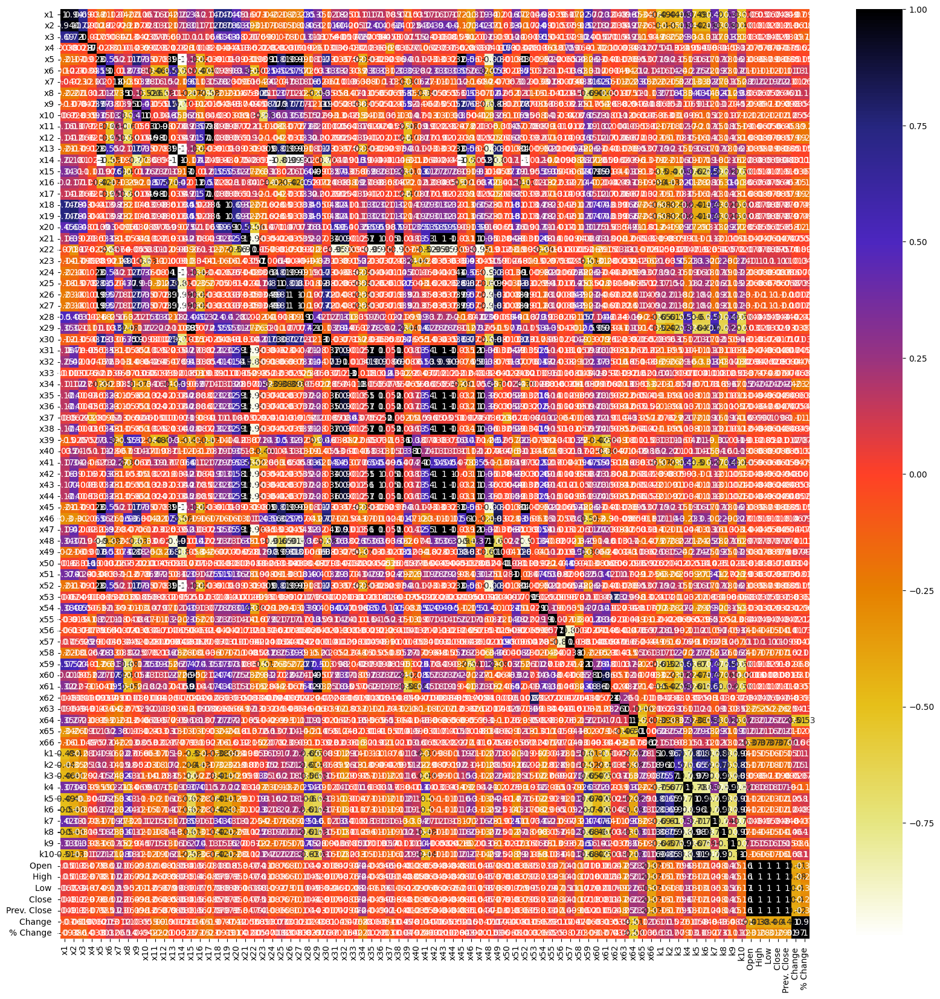

In [17]:
plt.figure(figsize=(20, 20))
cor = X.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.savefig('correlation.png')
plt.show()

In [7]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X, 0.97)
print(len(set(corr_features)))
print(corr_features)

29
{'k10', 'x43', 'k8', 'x14', 'x29', 'x17', 'k9', 'x45', 'Low ', 'x38', 'x36', 'Prev. Close ', 'x26', 'x44', 'High ', 'x13', 'Close ', '% Change ', 'x52', 'x24', 'x49', 'x27', 'x19', 'x42', 'x47', 'k5', 'x35', 'x31', 'x12'}


In [8]:
try:
    X = X.drop(list(corr_features), axis=1)
except Exception as e:
    print(e)

In [9]:
from sklearn.preprocessing import MinMaxScaler
from pandas import DataFrame
trans = MinMaxScaler()
X = trans.fit_transform(X)
# # convert the array back to a dataframe
X = DataFrame(X)
# summarize
print(X.describe())

              0          1          2          3          4          5   \
count  94.000000  94.000000  94.000000  94.000000  94.000000  94.000000   
mean    0.171469   0.145874   0.060225   0.127195   0.035265   0.106216   
std     0.186500   0.206640   0.168501   0.102026   0.124327   0.195280   
min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
25%     0.071321   0.036608   0.001785   0.113147   0.006793   0.009942   
50%     0.114615   0.078849   0.008249   0.113778   0.010328   0.036407   
75%     0.179680   0.132666   0.025845   0.115642   0.016885   0.086194   
max     1.000000   1.000000   1.000000   1.000000   1.000000   1.000000   

              6          7          8          9   ...         44         45  \
count  94.000000  94.000000  94.000000  94.000000  ...  94.000000  94.000000   
mean    0.220364   0.097243   0.050920   0.579868  ...   0.652932   0.796751   
std     0.221315   0.196373   0.107153   0.111306  ...   0.327494   0.248161   
min 

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,  random_state = 100)

In [11]:
# Convert the data into DMatrix format, which is XGBoost's internal data structure
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set XGBoost parameters
params = {
    'objective': 'multi:softmax',  # Multiclass classification
    'num_class': 3,  # Number of classes in the target variable
    'max_depth': 3,
    'eta': 0.1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'eval_metric': 'mlogloss'  # Multiclass logloss
}
num_rounds = 100
model = xgb.train(params, dtrain, num_rounds)

# Make predictions on the test set
y_pred = model.predict(dtest)

# Convert predicted labels to integers
y_pred = np.round(y_pred).astype(int)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 1.0


In [12]:
from mealpy import FloatVar
def fitness_function(position):
    learningrate,max_depth,subsample,n_estimators = position
    max_depth,n_estimators=int(max_depth),int(n_estimators)
    
    print(learningrate,max_depth,subsample,n_estimators)
    clf=xgb.XGBClassifier(eta=learningrate,n_estimators=n_estimators,max_depth=max_depth,subsample=subsample)
    evaluation= [(X_train, y_train ),(X_test,y_test)]
    clf.fit(X_train, y_train, eval_set=evaluation)
    # Accessing the evaluation results
    # Make predictions on the test set
    y_pred = clf.predict(X_test)
    
    # Convert predicted labels to integers
    y_pred = np.round(y_pred).astype(int)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    # evals_result = clf.evals_result()
    # val_accuracy = evals_result['validation_0']['auc'][-1]

    return accuracy
    
    # history = clf.fit(X_train,y_train, eval_set=evaluation,eval_metric='auc' )
    # return history.history['val_accuracy'][-1]


In [29]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma


class LFGOASSA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004,n=2, c_max: float = 2.0, ST: float = 0.8, PD: float = 0.2, SD: float = 0.1,**kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5
        self.ST = self.validator.check_float("ST", ST, (0, 1.0))
        self.PD = self.validator.check_float("PD", PD, (0, 1.0))
        self.SD = self.validator.check_float("SD", SD, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "ST", "PD", "SD"])
        self.n1 = int(self.PD * self.pop_size)
        self.n2 = int(self.SD * self.pop_size)
        self.n= n
        self.sort_flag = True

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        r2 = self.generator.uniform() 
        for idx in range(0, self.pop_size):
            if np.random.rand()<0.5:
                
                S_i_total = np.zeros(self.problem.n_dims)
                for j in range(0, self.pop_size):
                    dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                    r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                    xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                    ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                    ran = (c / 2) * (self.problem.ub - self.problem.lb)
                    s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                    S_i_total += s_ij
                x_new = (levy* c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            else:
                # Using equation (3) update the sparrow’s location;
                if idx < self.n1:
                    if r2 < self.ST:
                        des = (idx + 1) / (self.generator.uniform() * self.epoch + self.EPSILON)
                        if des > 5:
                            des = self.generator.uniform()
                        x_new = self.pop[idx].solution * np.exp(des)
                    else:
                        x_new = self.pop[idx].solution + self.generator.normal() * np.ones(self.problem.n_dims)
                else:
                    # Using equation (4) update the sparrow’s location;
                    _, x_p, worst = self.get_special_agents(self.pop, n_best=1, n_worst=1, minmax=self.problem.minmax)
                    g_best, g_worst = x_p[0], worst[0]
                    if idx > int(self.pop_size / 2):
                        x_new = self.generator.normal() * np.exp((g_worst.solution - self.pop[idx].solution) / (idx + 1) ** 2)
                    else:
                        L = np.ones((1, self.problem.n_dims))
                        A = np.sign(self.generator.uniform(-1, 1, (1, self.problem.n_dims)))
                        A1 = A.T * np.linalg.inv(np.matmul(A, A.T)) * L
                        x_new = g_best.solution + np.matmul(np.abs(self.pop[idx].solution - g_best.solution), A1)
                
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

# learningrate,max_depth,subsample,n_estimators
problem_dict = {
    "bounds": FloatVar( lb=(0.001,3,0, 50) , ub=(0.1, 18,1, 200) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }
model = LFGOASSA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

0.06925169655995347 14 0.835615617014074 150
[0]	validation_0-logloss:0.63577	validation_1-logloss:0.63951
[1]	validation_0-logloss:0.58594	validation_1-logloss:0.59287
[2]	validation_0-logloss:0.53985	validation_1-logloss:0.55023
[3]	validation_0-logloss:0.49876	validation_1-logloss:0.51251
[4]	validation_0-logloss:0.46205	validation_1-logloss:0.47905
[5]	validation_0-logloss:0.43034	validation_1-logloss:0.44460
[6]	validation_0-logloss:0.40198	validation_1-logloss:0.41357
[7]	validation_0-logloss:0.37609	validation_1-logloss:0.38520
[8]	validation_0-logloss:0.35178	validation_1-logloss:0.35800
[9]	validation_0-logloss:0.33010	validation_1-logloss:0.33450
[10]	validation_0-logloss:0.30917	validation_1-logloss:0.31662
[11]	validation_0-logloss:0.28946	validation_1-logloss:0.29953
[12]	validation_0-logloss:0.27205	validation_1-logloss:0.28596
[13]	validation_0-logloss:0.25566	validation_1-logloss:0.27196
[14]	validation_0-logloss:0.24036	validation_1-logloss:0.25906
[15]	validation_0-lo

2024/12/22 01:02:05 PM, INFO, __main__.LFGOASSA: Solving single objective optimization problem.


0.022025263537447697 12 0.7270594398707224 125
[0]	validation_0-logloss:0.67418	validation_1-logloss:0.68077
[1]	validation_0-logloss:0.65702	validation_1-logloss:0.66239
[2]	validation_0-logloss:0.63972	validation_1-logloss:0.64621
[3]	validation_0-logloss:0.62295	validation_1-logloss:0.63055
[4]	validation_0-logloss:0.60706	validation_1-logloss:0.61569
[5]	validation_0-logloss:0.59384	validation_1-logloss:0.60350
[6]	validation_0-logloss:0.57998	validation_1-logloss:0.58863
[7]	validation_0-logloss:0.56628	validation_1-logloss:0.57378
[8]	validation_0-logloss:0.55285	validation_1-logloss:0.56117
[9]	validation_0-logloss:0.54061	validation_1-logloss:0.54905
[10]	validation_0-logloss:0.52854	validation_1-logloss:0.53576
[11]	validation_0-logloss:0.51577	validation_1-logloss:0.52396
[12]	validation_0-logloss:0.50379	validation_1-logloss:0.51283
[13]	validation_0-logloss:0.49195	validation_1-logloss:0.50190
[14]	validation_0-logloss:0.48038	validation_1-logloss:0.49130
[15]	validation_0-

2024/12/22 01:02:10 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 1, Current best: 1.0, Global best: 1.0, Runtime: 2.46922 seconds


0.022013494511840957 12 0.7286740483701597 126
[0]	validation_0-logloss:0.67419	validation_1-logloss:0.68078
[1]	validation_0-logloss:0.65703	validation_1-logloss:0.66241
[2]	validation_0-logloss:0.63971	validation_1-logloss:0.64620
[3]	validation_0-logloss:0.62294	validation_1-logloss:0.63054
[4]	validation_0-logloss:0.60706	validation_1-logloss:0.61569
[5]	validation_0-logloss:0.59385	validation_1-logloss:0.60351
[6]	validation_0-logloss:0.58000	validation_1-logloss:0.58865
[7]	validation_0-logloss:0.56630	validation_1-logloss:0.57380
[8]	validation_0-logloss:0.55288	validation_1-logloss:0.56120
[9]	validation_0-logloss:0.54064	validation_1-logloss:0.54908
[10]	validation_0-logloss:0.52858	validation_1-logloss:0.53580
[11]	validation_0-logloss:0.51582	validation_1-logloss:0.52400
[12]	validation_0-logloss:0.50384	validation_1-logloss:0.51288
[13]	validation_0-logloss:0.49201	validation_1-logloss:0.50195
[14]	validation_0-logloss:0.48044	validation_1-logloss:0.49135
[15]	validation_0-

2024/12/22 01:02:13 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 2, Current best: 1.0, Global best: 1.0, Runtime: 2.36540 seconds


0.026012276170248316 12 0.7463298396332626 127
[0]	validation_0-logloss:0.67085	validation_1-logloss:0.67718
[1]	validation_0-logloss:0.65068	validation_1-logloss:0.65560
[2]	validation_0-logloss:0.63048	validation_1-logloss:0.63671
[3]	validation_0-logloss:0.61110	validation_1-logloss:0.61863
[4]	validation_0-logloss:0.59276	validation_1-logloss:0.60153
[5]	validation_0-logloss:0.57768	validation_1-logloss:0.58762
[6]	validation_0-logloss:0.56181	validation_1-logloss:0.57054
[7]	validation_0-logloss:0.54622	validation_1-logloss:0.55365
[8]	validation_0-logloss:0.53106	validation_1-logloss:0.53945
[9]	validation_0-logloss:0.51733	validation_1-logloss:0.52586
[10]	validation_0-logloss:0.50391	validation_1-logloss:0.51107
[11]	validation_0-logloss:0.48980	validation_1-logloss:0.49805
[12]	validation_0-logloss:0.47659	validation_1-logloss:0.48582
[13]	validation_0-logloss:0.46361	validation_1-logloss:0.47387
[14]	validation_0-logloss:0.45097	validation_1-logloss:0.46234
[15]	validation_0-

2024/12/22 01:02:15 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 3, Current best: 1.0, Global best: 1.0, Runtime: 2.66584 seconds


0.026086508887315195 17 0.7470042012268218 127
[0]	validation_0-logloss:0.67079	validation_1-logloss:0.67711
[1]	validation_0-logloss:0.65057	validation_1-logloss:0.65548
[2]	validation_0-logloss:0.63032	validation_1-logloss:0.63654
[3]	validation_0-logloss:0.61088	validation_1-logloss:0.61842
[4]	validation_0-logloss:0.59251	validation_1-logloss:0.60128
[5]	validation_0-logloss:0.57739	validation_1-logloss:0.58733
[6]	validation_0-logloss:0.56148	validation_1-logloss:0.57022
[7]	validation_0-logloss:0.54586	validation_1-logloss:0.55329
[8]	validation_0-logloss:0.53067	validation_1-logloss:0.53906
[9]	validation_0-logloss:0.51692	validation_1-logloss:0.52545
[10]	validation_0-logloss:0.50348	validation_1-logloss:0.51063
[11]	validation_0-logloss:0.48934	validation_1-logloss:0.49760
[12]	validation_0-logloss:0.47605	validation_1-logloss:0.48529
[13]	validation_0-logloss:0.46305	validation_1-logloss:0.47332
[14]	validation_0-logloss:0.45039	validation_1-logloss:0.46177
[15]	validation_0-

2024/12/22 01:02:17 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 4, Current best: 1.0, Global best: 1.0, Runtime: 2.23240 seconds


0.03010072609160922 18 0.8619539298086613 147
[0]	validation_0-logloss:0.66724	validation_1-logloss:0.67334
[1]	validation_0-logloss:0.64356	validation_1-logloss:0.65108
[2]	validation_0-logloss:0.62034	validation_1-logloss:0.62939
[3]	validation_0-logloss:0.59827	validation_1-logloss:0.60885
[4]	validation_0-logloss:0.57737	validation_1-logloss:0.58946
[5]	validation_0-logloss:0.55844	validation_1-logloss:0.56916
[6]	validation_0-logloss:0.54031	validation_1-logloss:0.54966
[7]	validation_0-logloss:0.52317	validation_1-logloss:0.53121
[8]	validation_0-logloss:0.50660	validation_1-logloss:0.51337
[9]	validation_0-logloss:0.49057	validation_1-logloss:0.49853
[10]	validation_0-logloss:0.47503	validation_1-logloss:0.48455
[11]	validation_0-logloss:0.45980	validation_1-logloss:0.47069
[12]	validation_0-logloss:0.44552	validation_1-logloss:0.45843
[13]	validation_0-logloss:0.43160	validation_1-logloss:0.44579
[14]	validation_0-logloss:0.41814	validation_1-logloss:0.43365
[15]	validation_0-l

2024/12/22 01:02:21 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 5, Current best: 1.0, Global best: 1.0, Runtime: 3.02289 seconds


0.030065436047734113 17 0.8627117943315381 145
[0]	validation_0-logloss:0.66727	validation_1-logloss:0.67337
[1]	validation_0-logloss:0.64362	validation_1-logloss:0.65113
[2]	validation_0-logloss:0.62042	validation_1-logloss:0.62947
[3]	validation_0-logloss:0.59837	validation_1-logloss:0.60895
[4]	validation_0-logloss:0.57749	validation_1-logloss:0.58957
[5]	validation_0-logloss:0.55858	validation_1-logloss:0.56929
[6]	validation_0-logloss:0.54046	validation_1-logloss:0.54981
[7]	validation_0-logloss:0.52333	validation_1-logloss:0.53138
[8]	validation_0-logloss:0.50677	validation_1-logloss:0.51355
[9]	validation_0-logloss:0.49075	validation_1-logloss:0.49871
[10]	validation_0-logloss:0.47523	validation_1-logloss:0.48474
[11]	validation_0-logloss:0.46001	validation_1-logloss:0.47090
[12]	validation_0-logloss:0.44574	validation_1-logloss:0.45864
[13]	validation_0-logloss:0.43182	validation_1-logloss:0.44601
[14]	validation_0-logloss:0.41837	validation_1-logloss:0.43387
[15]	validation_0-

2024/12/22 01:02:26 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 6, Current best: 1.0, Global best: 1.0, Runtime: 5.66214 seconds


0.030446569277965213 18 0.8736482109000524 147
[0]	validation_0-logloss:0.66696	validation_1-logloss:0.67304
[1]	validation_0-logloss:0.64291	validation_1-logloss:0.65043
[2]	validation_0-logloss:0.61946	validation_1-logloss:0.62853
[3]	validation_0-logloss:0.59718	validation_1-logloss:0.60780
[4]	validation_0-logloss:0.57610	validation_1-logloss:0.58824
[5]	validation_0-logloss:0.55696	validation_1-logloss:0.56770
[6]	validation_0-logloss:0.53824	validation_1-logloss:0.55032
[7]	validation_0-logloss:0.52096	validation_1-logloss:0.53169
[8]	validation_0-logloss:0.50419	validation_1-logloss:0.51362
[9]	validation_0-logloss:0.48847	validation_1-logloss:0.49665
[10]	validation_0-logloss:0.47285	validation_1-logloss:0.48261
[11]	validation_0-logloss:0.45751	validation_1-logloss:0.46865
[12]	validation_0-logloss:0.44314	validation_1-logloss:0.45632
[13]	validation_0-logloss:0.42983	validation_1-logloss:0.44181
[14]	validation_0-logloss:0.41624	validation_1-logloss:0.42953
[15]	validation_0-

2024/12/22 01:02:32 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 7, Current best: 1.0, Global best: 1.0, Runtime: 5.81733 seconds


0.001 17 0.47505525811101923 147
[0]	validation_0-logloss:0.69163	validation_1-logloss:0.69959
[1]	validation_0-logloss:0.69089	validation_1-logloss:0.69878
[2]	validation_0-logloss:0.69009	validation_1-logloss:0.69803
[3]	validation_0-logloss:0.68943	validation_1-logloss:0.69730
[4]	validation_0-logloss:0.68870	validation_1-logloss:0.69664
[5]	validation_0-logloss:0.68793	validation_1-logloss:0.69580
[6]	validation_0-logloss:0.68715	validation_1-logloss:0.69508
[7]	validation_0-logloss:0.68639	validation_1-logloss:0.69426
[8]	validation_0-logloss:0.68571	validation_1-logloss:0.69361
[9]	validation_0-logloss:0.68497	validation_1-logloss:0.69289
[10]	validation_0-logloss:0.68423	validation_1-logloss:0.69210
[11]	validation_0-logloss:0.68344	validation_1-logloss:0.69135
[12]	validation_0-logloss:0.68266	validation_1-logloss:0.69062
[13]	validation_0-logloss:0.68191	validation_1-logloss:0.68982
[14]	validation_0-logloss:0.68113	validation_1-logloss:0.68899
[15]	validation_0-logloss:0.6804

2024/12/22 01:02:38 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 8, Current best: 1.0, Global best: 1.0, Runtime: 5.62209 seconds


0.0010157416978273353 17 0.4825334344354896 149
[0]	validation_0-logloss:0.69161	validation_1-logloss:0.69958
[1]	validation_0-logloss:0.69087	validation_1-logloss:0.69876
[2]	validation_0-logloss:0.69004	validation_1-logloss:0.69799
[3]	validation_0-logloss:0.68937	validation_1-logloss:0.69724
[4]	validation_0-logloss:0.68863	validation_1-logloss:0.69657
[5]	validation_0-logloss:0.68784	validation_1-logloss:0.69572
[6]	validation_0-logloss:0.68706	validation_1-logloss:0.69498
[7]	validation_0-logloss:0.68628	validation_1-logloss:0.69415
[8]	validation_0-logloss:0.68559	validation_1-logloss:0.69349
[9]	validation_0-logloss:0.68484	validation_1-logloss:0.69276
[10]	validation_0-logloss:0.68408	validation_1-logloss:0.69195
[11]	validation_0-logloss:0.68328	validation_1-logloss:0.69120
[12]	validation_0-logloss:0.68249	validation_1-logloss:0.69046
[13]	validation_0-logloss:0.68172	validation_1-logloss:0.68963
[14]	validation_0-logloss:0.68094	validation_1-logloss:0.68880
[15]	validation_0

2024/12/22 01:02:42 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 9, Current best: 1.0, Global best: 1.0, Runtime: 4.55160 seconds


0.001028681396133321 18 0.48868050615411834 151
[0]	validation_0-logloss:0.69160	validation_1-logloss:0.69957
[1]	validation_0-logloss:0.69085	validation_1-logloss:0.69874
[2]	validation_0-logloss:0.69002	validation_1-logloss:0.69796
[3]	validation_0-logloss:0.68933	validation_1-logloss:0.69720
[4]	validation_0-logloss:0.68858	validation_1-logloss:0.69652
[5]	validation_0-logloss:0.68778	validation_1-logloss:0.69566
[6]	validation_0-logloss:0.68699	validation_1-logloss:0.69491
[7]	validation_0-logloss:0.68620	validation_1-logloss:0.69407
[8]	validation_0-logloss:0.68550	validation_1-logloss:0.69341
[9]	validation_0-logloss:0.68474	validation_1-logloss:0.69266
[10]	validation_0-logloss:0.68397	validation_1-logloss:0.69184
[11]	validation_0-logloss:0.68316	validation_1-logloss:0.69107
[12]	validation_0-logloss:0.68235	validation_1-logloss:0.69032
[13]	validation_0-logloss:0.68157	validation_1-logloss:0.68948
[14]	validation_0-logloss:0.68078	validation_1-logloss:0.68864
[15]	validation_0

2024/12/22 01:02:47 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 10, Current best: 1.0, Global best: 1.0, Runtime: 4.74792 seconds


0.001 17 0.4891852999186381 140
[0]	validation_0-logloss:0.69162	validation_1-logloss:0.69959
[1]	validation_0-logloss:0.69089	validation_1-logloss:0.69878
[2]	validation_0-logloss:0.69008	validation_1-logloss:0.69802
[3]	validation_0-logloss:0.68942	validation_1-logloss:0.69729
[4]	validation_0-logloss:0.68869	validation_1-logloss:0.69662
[5]	validation_0-logloss:0.68791	validation_1-logloss:0.69579
[6]	validation_0-logloss:0.68714	validation_1-logloss:0.69506
[7]	validation_0-logloss:0.68637	validation_1-logloss:0.69424
[8]	validation_0-logloss:0.68569	validation_1-logloss:0.69360
[9]	validation_0-logloss:0.68495	validation_1-logloss:0.69287
[10]	validation_0-logloss:0.68420	validation_1-logloss:0.69207
[11]	validation_0-logloss:0.68341	validation_1-logloss:0.69133
[12]	validation_0-logloss:0.68263	validation_1-logloss:0.69060
[13]	validation_0-logloss:0.68187	validation_1-logloss:0.68978
[14]	validation_0-logloss:0.68110	validation_1-logloss:0.68896
[15]	validation_0-logloss:0.68035

2024/12/22 01:02:52 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 11, Current best: 1.0, Global best: 1.0, Runtime: 4.95967 seconds


0.0010280008972432498 18 0.5028829272345682 144
[0]	validation_0-logloss:0.69160	validation_1-logloss:0.69957
[1]	validation_0-logloss:0.69083	validation_1-logloss:0.69872
[2]	validation_0-logloss:0.68999	validation_1-logloss:0.69794
[3]	validation_0-logloss:0.68930	validation_1-logloss:0.69717
[4]	validation_0-logloss:0.68855	validation_1-logloss:0.69648
[5]	validation_0-logloss:0.68775	validation_1-logloss:0.69562
[6]	validation_0-logloss:0.68695	validation_1-logloss:0.69487
[7]	validation_0-logloss:0.68615	validation_1-logloss:0.69402
[8]	validation_0-logloss:0.68546	validation_1-logloss:0.69336
[9]	validation_0-logloss:0.68470	validation_1-logloss:0.69262
[10]	validation_0-logloss:0.68393	validation_1-logloss:0.69180
[11]	validation_0-logloss:0.68311	validation_1-logloss:0.69103
[12]	validation_0-logloss:0.68230	validation_1-logloss:0.69027
[13]	validation_0-logloss:0.68151	validation_1-logloss:0.68942
[14]	validation_0-logloss:0.68071	validation_1-logloss:0.68857
[15]	validation_0

2024/12/22 01:02:57 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 12, Current best: 1.0, Global best: 1.0, Runtime: 4.70562 seconds


0.0010551934469948527 18 0.5161851228403584 147
[0]	validation_0-logloss:0.69158	validation_1-logloss:0.69955
[1]	validation_0-logloss:0.69081	validation_1-logloss:0.69885
[2]	validation_0-logloss:0.68995	validation_1-logloss:0.69804
[3]	validation_0-logloss:0.68923	validation_1-logloss:0.69725
[4]	validation_0-logloss:0.68846	validation_1-logloss:0.69655
[5]	validation_0-logloss:0.68764	validation_1-logloss:0.69566
[6]	validation_0-logloss:0.68681	validation_1-logloss:0.69488
[7]	validation_0-logloss:0.68599	validation_1-logloss:0.69401
[8]	validation_0-logloss:0.68527	validation_1-logloss:0.69333
[9]	validation_0-logloss:0.68449	validation_1-logloss:0.69256
[10]	validation_0-logloss:0.68370	validation_1-logloss:0.69172
[11]	validation_0-logloss:0.68286	validation_1-logloss:0.69092
[12]	validation_0-logloss:0.68203	validation_1-logloss:0.69015
[13]	validation_0-logloss:0.68119	validation_1-logloss:0.68936
[14]	validation_0-logloss:0.68038	validation_1-logloss:0.68849
[15]	validation_0

2024/12/22 01:03:01 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 13, Current best: 1.0, Global best: 1.0, Runtime: 4.47038 seconds


0.025166546274191355 18 1.0 200
[0]	validation_0-logloss:0.67106	validation_1-logloss:0.68017
[1]	validation_0-logloss:0.65072	validation_1-logloss:0.66102
[2]	validation_0-logloss:0.63127	validation_1-logloss:0.64277
[3]	validation_0-logloss:0.61266	validation_1-logloss:0.62534
[4]	validation_0-logloss:0.59483	validation_1-logloss:0.60870
[5]	validation_0-logloss:0.57775	validation_1-logloss:0.59280
[6]	validation_0-logloss:0.56136	validation_1-logloss:0.57759
[7]	validation_0-logloss:0.54562	validation_1-logloss:0.56332
[8]	validation_0-logloss:0.53049	validation_1-logloss:0.55019
[9]	validation_0-logloss:0.51592	validation_1-logloss:0.53707
[10]	validation_0-logloss:0.50190	validation_1-logloss:0.52448
[11]	validation_0-logloss:0.48840	validation_1-logloss:0.51342
[12]	validation_0-logloss:0.47538	validation_1-logloss:0.50132
[13]	validation_0-logloss:0.46283	validation_1-logloss:0.49018
[14]	validation_0-logloss:0.45073	validation_1-logloss:0.47948
[15]	validation_0-logloss:0.43905

2024/12/22 01:03:06 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 14, Current best: 1.0, Global best: 1.0, Runtime: 5.12487 seconds


0.025651475248172857 18 1.0 200
[0]	validation_0-logloss:0.67065	validation_1-logloss:0.67979
[1]	validation_0-logloss:0.64994	validation_1-logloss:0.66030
[2]	validation_0-logloss:0.63016	validation_1-logloss:0.64172
[3]	validation_0-logloss:0.61124	validation_1-logloss:0.62402
[4]	validation_0-logloss:0.59313	validation_1-logloss:0.60712
[5]	validation_0-logloss:0.57580	validation_1-logloss:0.59098
[6]	validation_0-logloss:0.55918	validation_1-logloss:0.57556
[7]	validation_0-logloss:0.54323	validation_1-logloss:0.56111
[8]	validation_0-logloss:0.52790	validation_1-logloss:0.54782
[9]	validation_0-logloss:0.51316	validation_1-logloss:0.53455
[10]	validation_0-logloss:0.49897	validation_1-logloss:0.52183
[11]	validation_0-logloss:0.48532	validation_1-logloss:0.51067
[12]	validation_0-logloss:0.47217	validation_1-logloss:0.49845
[13]	validation_0-logloss:0.45950	validation_1-logloss:0.48721
[14]	validation_0-logloss:0.44729	validation_1-logloss:0.47643
[15]	validation_0-logloss:0.43551

2024/12/22 01:03:12 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 15, Current best: 1.0, Global best: 1.0, Runtime: 5.91600 seconds


0.025465970535367533 18 1.0 200
[0]	validation_0-logloss:0.67081	validation_1-logloss:0.67993
[1]	validation_0-logloss:0.65024	validation_1-logloss:0.66057
[2]	validation_0-logloss:0.63058	validation_1-logloss:0.64212
[3]	validation_0-logloss:0.61178	validation_1-logloss:0.62452
[4]	validation_0-logloss:0.59378	validation_1-logloss:0.60772
[5]	validation_0-logloss:0.57654	validation_1-logloss:0.59168
[6]	validation_0-logloss:0.56001	validation_1-logloss:0.57634
[7]	validation_0-logloss:0.54414	validation_1-logloss:0.56195
[8]	validation_0-logloss:0.52889	validation_1-logloss:0.54873
[9]	validation_0-logloss:0.51421	validation_1-logloss:0.53551
[10]	validation_0-logloss:0.50009	validation_1-logloss:0.52284
[11]	validation_0-logloss:0.48649	validation_1-logloss:0.51172
[12]	validation_0-logloss:0.47339	validation_1-logloss:0.49954
[13]	validation_0-logloss:0.46077	validation_1-logloss:0.48835
[14]	validation_0-logloss:0.44860	validation_1-logloss:0.47759
[15]	validation_0-logloss:0.43686

2024/12/22 01:03:18 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 16, Current best: 1.0, Global best: 1.0, Runtime: 5.47140 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:03:22 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 17, Current best: 1.0, Global best: 1.0, Runtime: 4.80466 seconds


0.001 16 0.0 198
[0]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[1]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[2]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[3]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[4]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[5]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[6]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[7]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[8]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[9]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[10]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[11]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[12]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[13]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[14]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[15]	validation_0-logloss:0.69235	validation_1-l

2024/12/22 01:03:28 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 18, Current best: 1.0, Global best: 1.0, Runtime: 5.57052 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:03:34 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 19, Current best: 1.0, Global best: 1.0, Runtime: 5.95527 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:03:39 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 20, Current best: 1.0, Global best: 1.0, Runtime: 5.52328 seconds


0.09968604522438605 18 1.0 188
[0]	validation_0-logloss:0.61088	validation_1-logloss:0.62365
[1]	validation_0-logloss:0.54294	validation_1-logloss:0.56050
[2]	validation_0-logloss:0.48542	validation_1-logloss:0.50885
[3]	validation_0-logloss:0.43600	validation_1-logloss:0.46704
[4]	validation_0-logloss:0.39319	validation_1-logloss:0.42972
[5]	validation_0-logloss:0.35585	validation_1-logloss:0.39778
[6]	validation_0-logloss:0.32230	validation_1-logloss:0.35925
[7]	validation_0-logloss:0.29270	validation_1-logloss:0.32675
[8]	validation_0-logloss:0.26687	validation_1-logloss:0.29784
[9]	validation_0-logloss:0.24418	validation_1-logloss:0.27941
[10]	validation_0-logloss:0.22396	validation_1-logloss:0.26339
[11]	validation_0-logloss:0.20544	validation_1-logloss:0.24275
[12]	validation_0-logloss:0.18889	validation_1-logloss:0.22341
[13]	validation_0-logloss:0.17409	validation_1-logloss:0.20599
[14]	validation_0-logloss:0.16101	validation_1-logloss:0.19626
[15]	validation_0-logloss:0.14904	

2024/12/22 01:03:44 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 21, Current best: 1.0, Global best: 1.0, Runtime: 4.28425 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:03:49 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 22, Current best: 1.0, Global best: 1.0, Runtime: 5.30035 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:03:55 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 23, Current best: 1.0, Global best: 1.0, Runtime: 5.56701 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:00 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 24, Current best: 1.0, Global best: 1.0, Runtime: 5.66122 seconds


0.09996008772443302 17 1.0 196
[0]	validation_0-logloss:0.61067	validation_1-logloss:0.62345
[1]	validation_0-logloss:0.54258	validation_1-logloss:0.56017
[2]	validation_0-logloss:0.48496	validation_1-logloss:0.50843
[3]	validation_0-logloss:0.43548	validation_1-logloss:0.46658
[4]	validation_0-logloss:0.39262	validation_1-logloss:0.42923
[5]	validation_0-logloss:0.35526	validation_1-logloss:0.39728
[6]	validation_0-logloss:0.32169	validation_1-logloss:0.35872
[7]	validation_0-logloss:0.29209	validation_1-logloss:0.32620
[8]	validation_0-logloss:0.26625	validation_1-logloss:0.29728
[9]	validation_0-logloss:0.24357	validation_1-logloss:0.27888
[10]	validation_0-logloss:0.22337	validation_1-logloss:0.26287
[11]	validation_0-logloss:0.20485	validation_1-logloss:0.24224
[12]	validation_0-logloss:0.18832	validation_1-logloss:0.22290
[13]	validation_0-logloss:0.17362	validation_1-logloss:0.20526
[14]	validation_0-logloss:0.16055	validation_1-logloss:0.19557
[15]	validation_0-logloss:0.14855	

2024/12/22 01:04:05 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 25, Current best: 1.0, Global best: 1.0, Runtime: 5.20431 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:11 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 26, Current best: 1.0, Global best: 1.0, Runtime: 5.56705 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:15 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 27, Current best: 1.0, Global best: 1.0, Runtime: 4.37252 seconds


0.09999958792555398 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:04:21 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 28, Current best: 1.0, Global best: 1.0, Runtime: 5.61667 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:26 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 29, Current best: 1.0, Global best: 1.0, Runtime: 4.75649 seconds


0.0999832895958637 17 0.9997420962949398 200
[0]	validation_0-logloss:0.61065	validation_1-logloss:0.62343
[1]	validation_0-logloss:0.54255	validation_1-logloss:0.56014
[2]	validation_0-logloss:0.48492	validation_1-logloss:0.50840
[3]	validation_0-logloss:0.43543	validation_1-logloss:0.46654
[4]	validation_0-logloss:0.39258	validation_1-logloss:0.42919
[5]	validation_0-logloss:0.35521	validation_1-logloss:0.39724
[6]	validation_0-logloss:0.32163	validation_1-logloss:0.35867
[7]	validation_0-logloss:0.29203	validation_1-logloss:0.32615
[8]	validation_0-logloss:0.26620	validation_1-logloss:0.29724
[9]	validation_0-logloss:0.24351	validation_1-logloss:0.27883
[10]	validation_0-logloss:0.22332	validation_1-logloss:0.26283
[11]	validation_0-logloss:0.20480	validation_1-logloss:0.24220
[12]	validation_0-logloss:0.18827	validation_1-logloss:0.22286
[13]	validation_0-logloss:0.17357	validation_1-logloss:0.20522
[14]	validation_0-logloss:0.16050	validation_1-logloss:0.19554
[15]	validation_0-lo

2024/12/22 01:04:32 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 30, Current best: 1.0, Global best: 1.0, Runtime: 6.63371 seconds


0.1 17 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:36 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 31, Current best: 1.0, Global best: 1.0, Runtime: 3.21912 seconds


0.0999259981117971 18 1.0 166
[0]	validation_0-logloss:0.61069	validation_1-logloss:0.62348
[1]	validation_0-logloss:0.54263	validation_1-logloss:0.56021
[2]	validation_0-logloss:0.48502	validation_1-logloss:0.50849
[3]	validation_0-logloss:0.43554	validation_1-logloss:0.46664
[4]	validation_0-logloss:0.39269	validation_1-logloss:0.42930
[5]	validation_0-logloss:0.35533	validation_1-logloss:0.39734
[6]	validation_0-logloss:0.32176	validation_1-logloss:0.35879
[7]	validation_0-logloss:0.29216	validation_1-logloss:0.32627
[8]	validation_0-logloss:0.26633	validation_1-logloss:0.29735
[9]	validation_0-logloss:0.24364	validation_1-logloss:0.27894
[10]	validation_0-logloss:0.22344	validation_1-logloss:0.26294
[11]	validation_0-logloss:0.20492	validation_1-logloss:0.24230
[12]	validation_0-logloss:0.18839	validation_1-logloss:0.22297
[13]	validation_0-logloss:0.17369	validation_1-logloss:0.20533
[14]	validation_0-logloss:0.16061	validation_1-logloss:0.19563
[15]	validation_0-logloss:0.14861	v

2024/12/22 01:04:40 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 32, Current best: 1.0, Global best: 1.0, Runtime: 4.64383 seconds


0.1 18 1.0 168
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:46 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 33, Current best: 1.0, Global best: 1.0, Runtime: 5.46478 seconds


0.1 18 1.0 171
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:04:50 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 34, Current best: 1.0, Global best: 1.0, Runtime: 4.70850 seconds


0.09999999991230496 17 1.0 168
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:04:56 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 35, Current best: 1.0, Global best: 1.0, Runtime: 5.10667 seconds


0.1 18 1.0 168
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:00 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 36, Current best: 1.0, Global best: 1.0, Runtime: 4.29373 seconds


0.1 17 1.0 165
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:05 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 37, Current best: 1.0, Global best: 1.0, Runtime: 4.89933 seconds


0.1 18 1.0 166
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:10 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 38, Current best: 1.0, Global best: 1.0, Runtime: 4.91496 seconds


0.1 18 1.0 175
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:15 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 39, Current best: 1.0, Global best: 1.0, Runtime: 4.97621 seconds


0.09999998333610965 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:05:21 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 40, Current best: 1.0, Global best: 1.0, Runtime: 6.78742 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:30 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 41, Current best: 1.0, Global best: 1.0, Runtime: 8.27687 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:35 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 42, Current best: 1.0, Global best: 1.0, Runtime: 5.11804 seconds


0.001 16 0.0 198
[0]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[1]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[2]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[3]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[4]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[5]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[6]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[7]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[8]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[9]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[10]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[11]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[12]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[13]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[14]	validation_0-logloss:0.69235	validation_1-logloss:0.70026
[15]	validation_0-logloss:0.69235	validation_1-l

2024/12/22 01:05:40 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 43, Current best: 1.0, Global best: 1.0, Runtime: 4.66288 seconds


0.09999999917401844 18 1.0 194
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:05:44 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 44, Current best: 1.0, Global best: 1.0, Runtime: 4.51944 seconds


0.09999999917435581 17 1.0 196
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:05:49 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 45, Current best: 1.0, Global best: 1.0, Runtime: 4.87299 seconds


0.09999999917436714 18 1.0 194
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:05:53 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 46, Current best: 1.0, Global best: 1.0, Runtime: 4.31637 seconds


0.1 18 1.0 197
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:05:58 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 47, Current best: 1.0, Global best: 1.0, Runtime: 4.68906 seconds


0.1 18 0.9999815460525414 196
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:06:03 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 48, Current best: 1.0, Global best: 1.0, Runtime: 4.69123 seconds


0.09997271796538253 18 0.9978952845523992 194
[0]	validation_0-logloss:0.61066	validation_1-logloss:0.62344
[1]	validation_0-logloss:0.54257	validation_1-logloss:0.56016
[2]	validation_0-logloss:0.48494	validation_1-logloss:0.50842
[3]	validation_0-logloss:0.43545	validation_1-logloss:0.46656
[4]	validation_0-logloss:0.39260	validation_1-logloss:0.42921
[5]	validation_0-logloss:0.35523	validation_1-logloss:0.39726
[6]	validation_0-logloss:0.32166	validation_1-logloss:0.35869
[7]	validation_0-logloss:0.29206	validation_1-logloss:0.32617
[8]	validation_0-logloss:0.26626	validation_1-logloss:0.29730
[9]	validation_0-logloss:0.24361	validation_1-logloss:0.27892
[10]	validation_0-logloss:0.22341	validation_1-logloss:0.26291
[11]	validation_0-logloss:0.20492	validation_1-logloss:0.24231
[12]	validation_0-logloss:0.18838	validation_1-logloss:0.22296
[13]	validation_0-logloss:0.17367	validation_1-logloss:0.20531
[14]	validation_0-logloss:0.16059	validation_1-logloss:0.19562
[15]	validation_0-l

2024/12/22 01:06:07 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 49, Current best: 1.0, Global best: 1.0, Runtime: 4.52088 seconds


0.1 18 1.0 197
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:06:12 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 50, Current best: 1.0, Global best: 1.0, Runtime: 4.92561 seconds


0.1 17 1.0 196
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:06:17 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 51, Current best: 1.0, Global best: 1.0, Runtime: 5.19713 seconds


0.1 17 0.9996971417079359 197
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:06:22 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 52, Current best: 1.0, Global best: 1.0, Runtime: 5.11946 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:06:28 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 53, Current best: 1.0, Global best: 1.0, Runtime: 5.35006 seconds


0.1 17 0.9995624648565654 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:06:32 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 54, Current best: 1.0, Global best: 1.0, Runtime: 4.24840 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:06:36 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 55, Current best: 1.0, Global best: 1.0, Runtime: 3.54005 seconds


0.1 18 0.9968253583333655 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54265	validation_1-logloss:0.56021
[2]	validation_0-logloss:0.48500	validation_1-logloss:0.50845
[3]	validation_0-logloss:0.43549	validation_1-logloss:0.46658
[4]	validation_0-logloss:0.39262	validation_1-logloss:0.42922
[5]	validation_0-logloss:0.35524	validation_1-logloss:0.39726
[6]	validation_0-logloss:0.32166	validation_1-logloss:0.35869
[7]	validation_0-logloss:0.29205	validation_1-logloss:0.32616
[8]	validation_0-logloss:0.26625	validation_1-logloss:0.29728
[9]	validation_0-logloss:0.24359	validation_1-logloss:0.27889
[10]	validation_0-logloss:0.22338	validation_1-logloss:0.26289
[11]	validation_0-logloss:0.20489	validation_1-logloss:0.24228
[12]	validation_0-logloss:0.18835	validation_1-logloss:0.22293
[13]	validation_0-logloss:0.17364	validation_1-logloss:0.20528
[14]	validation_0-logloss:0.16056	validation_1-logloss:0.19559
[15]	validation_0-logloss:0.14855	v

2024/12/22 01:06:41 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 56, Current best: 1.0, Global best: 1.0, Runtime: 5.55076 seconds


0.09821087553218534 18 0.9963564687368894 198
[0]	validation_0-logloss:0.61203	validation_1-logloss:0.62473
[1]	validation_0-logloss:0.54499	validation_1-logloss:0.56237
[2]	validation_0-logloss:0.48798	validation_1-logloss:0.51115
[3]	validation_0-logloss:0.43891	validation_1-logloss:0.46960
[4]	validation_0-logloss:0.39633	validation_1-logloss:0.43244
[5]	validation_0-logloss:0.35912	validation_1-logloss:0.40056
[6]	validation_0-logloss:0.32566	validation_1-logloss:0.36219
[7]	validation_0-logloss:0.29611	validation_1-logloss:0.32977
[8]	validation_0-logloss:0.27054	validation_1-logloss:0.30884
[9]	validation_0-logloss:0.24743	validation_1-logloss:0.28267
[10]	validation_0-logloss:0.22685	validation_1-logloss:0.25923
[11]	validation_0-logloss:0.20834	validation_1-logloss:0.23890
[12]	validation_0-logloss:0.19204	validation_1-logloss:0.22619
[13]	validation_0-logloss:0.17712	validation_1-logloss:0.21000
[14]	validation_0-logloss:0.16370	validation_1-logloss:0.19381
[15]	validation_0-l

2024/12/22 01:06:47 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 57, Current best: 1.0, Global best: 1.0, Runtime: 5.71760 seconds


0.09819335152332925 18 0.9963355852857607 200
[0]	validation_0-logloss:0.61204	validation_1-logloss:0.62474
[1]	validation_0-logloss:0.54501	validation_1-logloss:0.56239
[2]	validation_0-logloss:0.48801	validation_1-logloss:0.51118
[3]	validation_0-logloss:0.43894	validation_1-logloss:0.46963
[4]	validation_0-logloss:0.39636	validation_1-logloss:0.43247
[5]	validation_0-logloss:0.35916	validation_1-logloss:0.40060
[6]	validation_0-logloss:0.32570	validation_1-logloss:0.36222
[7]	validation_0-logloss:0.29615	validation_1-logloss:0.32981
[8]	validation_0-logloss:0.27058	validation_1-logloss:0.30887
[9]	validation_0-logloss:0.24747	validation_1-logloss:0.28270
[10]	validation_0-logloss:0.22689	validation_1-logloss:0.25927
[11]	validation_0-logloss:0.20837	validation_1-logloss:0.23894
[12]	validation_0-logloss:0.19208	validation_1-logloss:0.22623
[13]	validation_0-logloss:0.17715	validation_1-logloss:0.21004
[14]	validation_0-logloss:0.16373	validation_1-logloss:0.19384
[15]	validation_0-l

2024/12/22 01:06:53 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 58, Current best: 1.0, Global best: 1.0, Runtime: 5.75154 seconds


0.09918558578888967 18 1.0 200
[0]	validation_0-logloss:0.61127	validation_1-logloss:0.62402
[1]	validation_0-logloss:0.54359	validation_1-logloss:0.56110
[2]	validation_0-logloss:0.48625	validation_1-logloss:0.50960
[3]	validation_0-logloss:0.43695	validation_1-logloss:0.46788
[4]	validation_0-logloss:0.39422	validation_1-logloss:0.43062
[5]	validation_0-logloss:0.35693	validation_1-logloss:0.39871
[6]	validation_0-logloss:0.32341	validation_1-logloss:0.36023
[7]	validation_0-logloss:0.29384	validation_1-logloss:0.32775
[8]	validation_0-logloss:0.26800	validation_1-logloss:0.29886
[9]	validation_0-logloss:0.24530	validation_1-logloss:0.28040
[10]	validation_0-logloss:0.22506	validation_1-logloss:0.26434
[11]	validation_0-logloss:0.20651	validation_1-logloss:0.24369
[12]	validation_0-logloss:0.18994	validation_1-logloss:0.22433
[13]	validation_0-logloss:0.17511	validation_1-logloss:0.20689
[14]	validation_0-logloss:0.16199	validation_1-logloss:0.19711
[15]	validation_0-logloss:0.14999	

2024/12/22 01:07:02 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 59, Current best: 1.0, Global best: 1.0, Runtime: 9.74325 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:07:12 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 60, Current best: 1.0, Global best: 1.0, Runtime: 10.11987 seconds


0.09998110562168208 17 0.9991388018659243 199
[0]	validation_0-logloss:0.61065	validation_1-logloss:0.62344
[1]	validation_0-logloss:0.54256	validation_1-logloss:0.56015
[2]	validation_0-logloss:0.48493	validation_1-logloss:0.50840
[3]	validation_0-logloss:0.43544	validation_1-logloss:0.46654
[4]	validation_0-logloss:0.39258	validation_1-logloss:0.42920
[5]	validation_0-logloss:0.35521	validation_1-logloss:0.39724
[6]	validation_0-logloss:0.32164	validation_1-logloss:0.35868
[7]	validation_0-logloss:0.29204	validation_1-logloss:0.32616
[8]	validation_0-logloss:0.26620	validation_1-logloss:0.29724
[9]	validation_0-logloss:0.24352	validation_1-logloss:0.27883
[10]	validation_0-logloss:0.22332	validation_1-logloss:0.26283
[11]	validation_0-logloss:0.20481	validation_1-logloss:0.24220
[12]	validation_0-logloss:0.18828	validation_1-logloss:0.22286
[13]	validation_0-logloss:0.17358	validation_1-logloss:0.20523
[14]	validation_0-logloss:0.16051	validation_1-logloss:0.19554
[15]	validation_0-l

2024/12/22 01:07:19 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 61, Current best: 1.0, Global best: 1.0, Runtime: 6.66393 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:07:23 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 62, Current best: 1.0, Global best: 1.0, Runtime: 3.65204 seconds


0.09999361826225221 17 0.999911681054394 200
[0]	validation_0-logloss:0.61064	validation_1-logloss:0.62343
[1]	validation_0-logloss:0.54254	validation_1-logloss:0.56013
[2]	validation_0-logloss:0.48491	validation_1-logloss:0.50838
[3]	validation_0-logloss:0.43541	validation_1-logloss:0.46652
[4]	validation_0-logloss:0.39256	validation_1-logloss:0.42917
[5]	validation_0-logloss:0.35519	validation_1-logloss:0.39722
[6]	validation_0-logloss:0.32161	validation_1-logloss:0.35865
[7]	validation_0-logloss:0.29201	validation_1-logloss:0.32613
[8]	validation_0-logloss:0.26617	validation_1-logloss:0.29721
[9]	validation_0-logloss:0.24349	validation_1-logloss:0.27881
[10]	validation_0-logloss:0.22329	validation_1-logloss:0.26281
[11]	validation_0-logloss:0.20478	validation_1-logloss:0.24218
[12]	validation_0-logloss:0.18825	validation_1-logloss:0.22284
[13]	validation_0-logloss:0.17355	validation_1-logloss:0.20520
[14]	validation_0-logloss:0.16048	validation_1-logloss:0.19552
[15]	validation_0-lo

2024/12/22 01:07:27 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 63, Current best: 1.0, Global best: 1.0, Runtime: 4.40164 seconds


0.001 17 0.6125053758266943 199
[0]	validation_0-logloss:0.69160	validation_1-logloss:0.69957
[1]	validation_0-logloss:0.69085	validation_1-logloss:0.69889
[2]	validation_0-logloss:0.69002	validation_1-logloss:0.69811
[3]	validation_0-logloss:0.68921	validation_1-logloss:0.69724
[4]	validation_0-logloss:0.68839	validation_1-logloss:0.69647
[5]	validation_0-logloss:0.68763	validation_1-logloss:0.69566
[6]	validation_0-logloss:0.68682	validation_1-logloss:0.69490
[7]	validation_0-logloss:0.68604	validation_1-logloss:0.69406
[8]	validation_0-logloss:0.68529	validation_1-logloss:0.69338
[9]	validation_0-logloss:0.68461	validation_1-logloss:0.69277
[10]	validation_0-logloss:0.68391	validation_1-logloss:0.69203
[11]	validation_0-logloss:0.68308	validation_1-logloss:0.69126
[12]	validation_0-logloss:0.68227	validation_1-logloss:0.69050
[13]	validation_0-logloss:0.68146	validation_1-logloss:0.68973
[14]	validation_0-logloss:0.68065	validation_1-logloss:0.68898
[15]	validation_0-logloss:0.67986

2024/12/22 01:07:32 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 64, Current best: 1.0, Global best: 1.0, Runtime: 4.94698 seconds


0.098313134070402 17 0.7098185098970963 199
[0]	validation_0-logloss:0.61430	validation_1-logloss:0.61637
[1]	validation_0-logloss:0.55031	validation_1-logloss:0.54741
[2]	validation_0-logloss:0.49160	validation_1-logloss:0.49334
[3]	validation_0-logloss:0.44088	validation_1-logloss:0.44708
[4]	validation_0-logloss:0.39803	validation_1-logloss:0.40830
[5]	validation_0-logloss:0.36554	validation_1-logloss:0.37774
[6]	validation_0-logloss:0.33499	validation_1-logloss:0.34366
[7]	validation_0-logloss:0.30750	validation_1-logloss:0.31257
[8]	validation_0-logloss:0.28215	validation_1-logloss:0.28994
[9]	validation_0-logloss:0.25974	validation_1-logloss:0.26790
[10]	validation_0-logloss:0.23983	validation_1-logloss:0.24501
[11]	validation_0-logloss:0.22026	validation_1-logloss:0.22820
[12]	validation_0-logloss:0.20335	validation_1-logloss:0.21552
[13]	validation_0-logloss:0.18801	validation_1-logloss:0.20267
[14]	validation_0-logloss:0.17384	validation_1-logloss:0.19109
[15]	validation_0-log

2024/12/22 01:07:38 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 65, Current best: 1.0, Global best: 1.0, Runtime: 5.90769 seconds


0.1 18 0.7384506951642446 200
[0]	validation_0-logloss:0.61274	validation_1-logloss:0.61463
[1]	validation_0-logloss:0.54735	validation_1-logloss:0.54430
[2]	validation_0-logloss:0.48779	validation_1-logloss:0.48946
[3]	validation_0-logloss:0.43676	validation_1-logloss:0.44294
[4]	validation_0-logloss:0.39333	validation_1-logloss:0.40371
[5]	validation_0-logloss:0.36082	validation_1-logloss:0.37309
[6]	validation_0-logloss:0.33021	validation_1-logloss:0.33888
[7]	validation_0-logloss:0.30264	validation_1-logloss:0.30762
[8]	validation_0-logloss:0.27733	validation_1-logloss:0.28504
[9]	validation_0-logloss:0.25476	validation_1-logloss:0.26290
[10]	validation_0-logloss:0.23492	validation_1-logloss:0.24008
[11]	validation_0-logloss:0.21546	validation_1-logloss:0.22341
[12]	validation_0-logloss:0.19913	validation_1-logloss:0.20944
[13]	validation_0-logloss:0.18381	validation_1-logloss:0.19677
[14]	validation_0-logloss:0.16977	validation_1-logloss:0.18548
[15]	validation_0-logloss:0.15779	v

2024/12/22 01:07:45 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 66, Current best: 1.0, Global best: 1.0, Runtime: 7.43227 seconds


0.1 17 0.7381407937921223 200
[0]	validation_0-logloss:0.61274	validation_1-logloss:0.61463
[1]	validation_0-logloss:0.54735	validation_1-logloss:0.54430
[2]	validation_0-logloss:0.48779	validation_1-logloss:0.48946
[3]	validation_0-logloss:0.43676	validation_1-logloss:0.44294
[4]	validation_0-logloss:0.39343	validation_1-logloss:0.40378
[5]	validation_0-logloss:0.36091	validation_1-logloss:0.37315
[6]	validation_0-logloss:0.33029	validation_1-logloss:0.33894
[7]	validation_0-logloss:0.30271	validation_1-logloss:0.30766
[8]	validation_0-logloss:0.27739	validation_1-logloss:0.28509
[9]	validation_0-logloss:0.25481	validation_1-logloss:0.26294
[10]	validation_0-logloss:0.23497	validation_1-logloss:0.24011
[11]	validation_0-logloss:0.21551	validation_1-logloss:0.22344
[12]	validation_0-logloss:0.19917	validation_1-logloss:0.20946
[13]	validation_0-logloss:0.18385	validation_1-logloss:0.19679
[14]	validation_0-logloss:0.16981	validation_1-logloss:0.18550
[15]	validation_0-logloss:0.15782	v

2024/12/22 01:07:55 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 67, Current best: 1.0, Global best: 1.0, Runtime: 9.99893 seconds


0.001 17 0.6268609618453835 199
[0]	validation_0-logloss:0.69153	validation_1-logloss:0.69939
[1]	validation_0-logloss:0.69077	validation_1-logloss:0.69870
[2]	validation_0-logloss:0.68994	validation_1-logloss:0.69792
[3]	validation_0-logloss:0.68912	validation_1-logloss:0.69704
[4]	validation_0-logloss:0.68830	validation_1-logloss:0.69627
[5]	validation_0-logloss:0.68760	validation_1-logloss:0.69563
[6]	validation_0-logloss:0.68678	validation_1-logloss:0.69486
[7]	validation_0-logloss:0.68600	validation_1-logloss:0.69402
[8]	validation_0-logloss:0.68524	validation_1-logloss:0.69333
[9]	validation_0-logloss:0.68456	validation_1-logloss:0.69270
[10]	validation_0-logloss:0.68385	validation_1-logloss:0.69197
[11]	validation_0-logloss:0.68303	validation_1-logloss:0.69119
[12]	validation_0-logloss:0.68221	validation_1-logloss:0.69043
[13]	validation_0-logloss:0.68139	validation_1-logloss:0.68966
[14]	validation_0-logloss:0.68058	validation_1-logloss:0.68890
[15]	validation_0-logloss:0.67979

2024/12/22 01:08:00 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 68, Current best: 1.0, Global best: 1.0, Runtime: 4.90244 seconds


0.001380051256070886 17 0.6232995056713031 200
[0]	validation_0-logloss:0.69132	validation_1-logloss:0.69931
[1]	validation_0-logloss:0.69028	validation_1-logloss:0.69836
[2]	validation_0-logloss:0.68912	validation_1-logloss:0.69728
[3]	validation_0-logloss:0.68800	validation_1-logloss:0.69608
[4]	validation_0-logloss:0.68687	validation_1-logloss:0.69501
[5]	validation_0-logloss:0.68582	validation_1-logloss:0.69389
[6]	validation_0-logloss:0.68470	validation_1-logloss:0.69284
[7]	validation_0-logloss:0.68362	validation_1-logloss:0.69169
[8]	validation_0-logloss:0.68258	validation_1-logloss:0.69075
[9]	validation_0-logloss:0.68165	validation_1-logloss:0.68989
[10]	validation_0-logloss:0.68068	validation_1-logloss:0.68888
[11]	validation_0-logloss:0.67956	validation_1-logloss:0.68782
[12]	validation_0-logloss:0.67844	validation_1-logloss:0.68678
[13]	validation_0-logloss:0.67732	validation_1-logloss:0.68573
[14]	validation_0-logloss:0.67622	validation_1-logloss:0.68469
[15]	validation_0-

2024/12/22 01:08:06 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 69, Current best: 1.0, Global best: 1.0, Runtime: 5.20295 seconds


0.0014384462792970609 18 0.6496735906557738 200
[0]	validation_0-logloss:0.69117	validation_1-logloss:0.69900
[1]	validation_0-logloss:0.69007	validation_1-logloss:0.69800
[2]	validation_0-logloss:0.68886	validation_1-logloss:0.69687
[3]	validation_0-logloss:0.68769	validation_1-logloss:0.69562
[4]	validation_0-logloss:0.68651	validation_1-logloss:0.69451
[5]	validation_0-logloss:0.68550	validation_1-logloss:0.69358
[6]	validation_0-logloss:0.68439	validation_1-logloss:0.69240
[7]	validation_0-logloss:0.68326	validation_1-logloss:0.69119
[8]	validation_0-logloss:0.68218	validation_1-logloss:0.69020
[9]	validation_0-logloss:0.68119	validation_1-logloss:0.68930
[10]	validation_0-logloss:0.68018	validation_1-logloss:0.68825
[11]	validation_0-logloss:0.67901	validation_1-logloss:0.68715
[12]	validation_0-logloss:0.67784	validation_1-logloss:0.68605
[13]	validation_0-logloss:0.67667	validation_1-logloss:0.68495
[14]	validation_0-logloss:0.67551	validation_1-logloss:0.68386
[15]	validation_0

2024/12/22 01:08:12 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 70, Current best: 1.0, Global best: 1.0, Runtime: 5.96439 seconds


0.0014429014294674652 18 0.6488697697813104 198
[0]	validation_0-logloss:0.69116	validation_1-logloss:0.69899
[1]	validation_0-logloss:0.69006	validation_1-logloss:0.69800
[2]	validation_0-logloss:0.68886	validation_1-logloss:0.69686
[3]	validation_0-logloss:0.68768	validation_1-logloss:0.69560
[4]	validation_0-logloss:0.68650	validation_1-logloss:0.69449
[5]	validation_0-logloss:0.68548	validation_1-logloss:0.69356
[6]	validation_0-logloss:0.68437	validation_1-logloss:0.69238
[7]	validation_0-logloss:0.68323	validation_1-logloss:0.69116
[8]	validation_0-logloss:0.68215	validation_1-logloss:0.69017
[9]	validation_0-logloss:0.68116	validation_1-logloss:0.68927
[10]	validation_0-logloss:0.68015	validation_1-logloss:0.68822
[11]	validation_0-logloss:0.67897	validation_1-logloss:0.68711
[12]	validation_0-logloss:0.67780	validation_1-logloss:0.68601
[13]	validation_0-logloss:0.67663	validation_1-logloss:0.68491
[14]	validation_0-logloss:0.67546	validation_1-logloss:0.68382
[15]	validation_0

2024/12/22 01:08:28 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 71, Current best: 1.0, Global best: 1.0, Runtime: 16.45839 seconds


0.1 18 1.0 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:08:34 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 72, Current best: 1.0, Global best: 1.0, Runtime: 6.05455 seconds


0.1 17 0.9981289317846334 198
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26620	validation_1-logloss:0.29724
[9]	validation_0-logloss:0.24355	validation_1-logloss:0.27886
[10]	validation_0-logloss:0.22335	validation_1-logloss:0.26286
[11]	validation_0-logloss:0.20486	validation_1-logloss:0.24225
[12]	validation_0-logloss:0.18832	validation_1-logloss:0.22291
[13]	validation_0-logloss:0.17361	validation_1-logloss:0.20526
[14]	validation_0-logloss:0.16054	validation_1-logloss:0.19557
[15]	validation_0-logloss:0.14853	v

2024/12/22 01:08:42 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 73, Current best: 1.0, Global best: 1.0, Runtime: 8.10681 seconds


0.1 17 0.9971260516755369 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54265	validation_1-logloss:0.56021
[2]	validation_0-logloss:0.48500	validation_1-logloss:0.50845
[3]	validation_0-logloss:0.43549	validation_1-logloss:0.46658
[4]	validation_0-logloss:0.39262	validation_1-logloss:0.42922
[5]	validation_0-logloss:0.35524	validation_1-logloss:0.39726
[6]	validation_0-logloss:0.32166	validation_1-logloss:0.35869
[7]	validation_0-logloss:0.29205	validation_1-logloss:0.32616
[8]	validation_0-logloss:0.26625	validation_1-logloss:0.29728
[9]	validation_0-logloss:0.24359	validation_1-logloss:0.27889
[10]	validation_0-logloss:0.22338	validation_1-logloss:0.26289
[11]	validation_0-logloss:0.20489	validation_1-logloss:0.24228
[12]	validation_0-logloss:0.18835	validation_1-logloss:0.22293
[13]	validation_0-logloss:0.17364	validation_1-logloss:0.20528
[14]	validation_0-logloss:0.16056	validation_1-logloss:0.19559
[15]	validation_0-logloss:0.14855	v

2024/12/22 01:08:49 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 74, Current best: 1.0, Global best: 1.0, Runtime: 6.73395 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:08:56 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 75, Current best: 1.0, Global best: 1.0, Runtime: 7.26199 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:05 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 76, Current best: 1.0, Global best: 1.0, Runtime: 8.55582 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:11 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 77, Current best: 1.0, Global best: 1.0, Runtime: 6.01877 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:18 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 78, Current best: 1.0, Global best: 1.0, Runtime: 6.90654 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:23 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 79, Current best: 1.0, Global best: 1.0, Runtime: 5.83401 seconds


0.09999580832432907 18 1.0 199
[0]	validation_0-logloss:0.61064	validation_1-logloss:0.62343
[1]	validation_0-logloss:0.54254	validation_1-logloss:0.56013
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50838
[3]	validation_0-logloss:0.43541	validation_1-logloss:0.46652
[4]	validation_0-logloss:0.39255	validation_1-logloss:0.42917
[5]	validation_0-logloss:0.35518	validation_1-logloss:0.39722
[6]	validation_0-logloss:0.32161	validation_1-logloss:0.35865
[7]	validation_0-logloss:0.29201	validation_1-logloss:0.32613
[8]	validation_0-logloss:0.26617	validation_1-logloss:0.29721
[9]	validation_0-logloss:0.24349	validation_1-logloss:0.27881
[10]	validation_0-logloss:0.22329	validation_1-logloss:0.26281
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18825	validation_1-logloss:0.22284
[13]	validation_0-logloss:0.17355	validation_1-logloss:0.20520
[14]	validation_0-logloss:0.16048	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14848	

2024/12/22 01:09:30 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 80, Current best: 1.0, Global best: 1.0, Runtime: 6.22423 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:36 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 81, Current best: 1.0, Global best: 1.0, Runtime: 6.67309 seconds


0.099998172632306 18 0.9999998667186726 199
[0]	validation_0-logloss:0.61064	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56013
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50838
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39255	validation_1-logloss:0.42917
[5]	validation_0-logloss:0.35518	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35865
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29721
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20520
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-log

2024/12/22 01:09:43 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 82, Current best: 1.0, Global best: 1.0, Runtime: 7.08918 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:52 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 83, Current best: 1.0, Global best: 1.0, Runtime: 8.56976 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:09:58 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 84, Current best: 1.0, Global best: 1.0, Runtime: 5.97514 seconds


0.1 18 0.9999988122695097 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:10:06 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 85, Current best: 1.0, Global best: 1.0, Runtime: 8.33518 seconds


0.09999975387534783 18 1.0 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	

2024/12/22 01:10:13 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 86, Current best: 1.0, Global best: 1.0, Runtime: 6.79836 seconds


0.09999963830046377 17 0.9999998404825791 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-l

2024/12/22 01:10:20 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 87, Current best: 1.0, Global best: 1.0, Runtime: 6.62321 seconds


0.09999963795882048 18 0.999999473958734 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-lo

2024/12/22 01:10:26 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 88, Current best: 1.0, Global best: 1.0, Runtime: 6.32889 seconds


0.0999990514145471 18 0.9999710847802435 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48490	validation_1-logloss:0.50838
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42917
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-lo

2024/12/22 01:10:33 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 89, Current best: 1.0, Global best: 1.0, Runtime: 7.39479 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:10:40 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 90, Current best: 1.0, Global best: 1.0, Runtime: 6.41086 seconds


0.0999999996591794 18 0.9999999822802598 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-lo

2024/12/22 01:10:47 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 91, Current best: 1.0, Global best: 1.0, Runtime: 7.43747 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:10:57 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 92, Current best: 1.0, Global best: 1.0, Runtime: 9.42377 seconds


0.1 18 0.9999586584001298 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:11:07 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 93, Current best: 1.0, Global best: 1.0, Runtime: 10.69391 seconds


0.09999999999999311 18 0.9995953351027931 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-l

2024/12/22 01:11:17 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 94, Current best: 1.0, Global best: 1.0, Runtime: 9.06080 seconds


0.1 17 0.9995949735255211 199
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	v

2024/12/22 01:11:24 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 95, Current best: 1.0, Global best: 1.0, Runtime: 7.95289 seconds


0.1 18 1.0 200
[0]	validation_0-logloss:0.61063	validation_1-logloss:0.62342
[1]	validation_0-logloss:0.54253	validation_1-logloss:0.56012
[2]	validation_0-logloss:0.48489	validation_1-logloss:0.50837
[3]	validation_0-logloss:0.43540	validation_1-logloss:0.46651
[4]	validation_0-logloss:0.39254	validation_1-logloss:0.42916
[5]	validation_0-logloss:0.35517	validation_1-logloss:0.39721
[6]	validation_0-logloss:0.32160	validation_1-logloss:0.35864
[7]	validation_0-logloss:0.29200	validation_1-logloss:0.32612
[8]	validation_0-logloss:0.26616	validation_1-logloss:0.29720
[9]	validation_0-logloss:0.24348	validation_1-logloss:0.27880
[10]	validation_0-logloss:0.22328	validation_1-logloss:0.26280
[11]	validation_0-logloss:0.20477	validation_1-logloss:0.24217
[12]	validation_0-logloss:0.18824	validation_1-logloss:0.22283
[13]	validation_0-logloss:0.17354	validation_1-logloss:0.20519
[14]	validation_0-logloss:0.16047	validation_1-logloss:0.19551
[15]	validation_0-logloss:0.14847	validation_1-log

2024/12/22 01:11:30 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 96, Current best: 1.0, Global best: 1.0, Runtime: 5.47404 seconds


0.09071296749651507 17 0.990712967496515 199
[0]	validation_0-logloss:0.61790	validation_1-logloss:0.63022
[1]	validation_0-logloss:0.55499	validation_1-logloss:0.57165
[2]	validation_0-logloss:0.50080	validation_1-logloss:0.52281
[3]	validation_0-logloss:0.45368	validation_1-logloss:0.48269
[4]	validation_0-logloss:0.41242	validation_1-logloss:0.44646
[5]	validation_0-logloss:0.37585	validation_1-logloss:0.40572
[6]	validation_0-logloss:0.34352	validation_1-logloss:0.37809
[7]	validation_0-logloss:0.31479	validation_1-logloss:0.35653
[8]	validation_0-logloss:0.28866	validation_1-logloss:0.32746
[9]	validation_0-logloss:0.26587	validation_1-logloss:0.30868
[10]	validation_0-logloss:0.24499	validation_1-logloss:0.28466
[11]	validation_0-logloss:0.22612	validation_1-logloss:0.26193
[12]	validation_0-logloss:0.20936	validation_1-logloss:0.24873
[13]	validation_0-logloss:0.19394	validation_1-logloss:0.23064
[14]	validation_0-logloss:0.17996	validation_1-logloss:0.21416
[15]	validation_0-lo

2024/12/22 01:11:37 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 97, Current best: 1.0, Global best: 1.0, Runtime: 6.59183 seconds


0.09197490920165452 18 1.0 200
[0]	validation_0-logloss:0.61691	validation_1-logloss:0.62929
[1]	validation_0-logloss:0.55310	validation_1-logloss:0.56990
[2]	validation_0-logloss:0.49845	validation_1-logloss:0.52067
[3]	validation_0-logloss:0.45101	validation_1-logloss:0.48032
[4]	validation_0-logloss:0.40952	validation_1-logloss:0.44393
[5]	validation_0-logloss:0.37303	validation_1-logloss:0.41246
[6]	validation_0-logloss:0.34008	validation_1-logloss:0.37484
[7]	validation_0-logloss:0.31136	validation_1-logloss:0.35338
[8]	validation_0-logloss:0.28540	validation_1-logloss:0.32408
[9]	validation_0-logloss:0.26219	validation_1-logloss:0.29881
[10]	validation_0-logloss:0.24168	validation_1-logloss:0.28200
[11]	validation_0-logloss:0.22281	validation_1-logloss:0.26020
[12]	validation_0-logloss:0.20581	validation_1-logloss:0.23956
[13]	validation_0-logloss:0.19046	validation_1-logloss:0.22171
[14]	validation_0-logloss:0.17685	validation_1-logloss:0.21239
[15]	validation_0-logloss:0.16430	

2024/12/22 01:11:42 PM, INFO, __main__.LFGOASSA: >>>Problem: P, Epoch: 98, Current best: 1.0, Global best: 1.0, Runtime: 5.21208 seconds


0.0959262498863896 18 1.0 200
[0]	validation_0-logloss:0.61381	validation_1-logloss:0.62640
[1]	validation_0-logloss:0.54787	validation_1-logloss:0.56506
[2]	validation_0-logloss:0.49172	validation_1-logloss:0.51456
[3]	validation_0-logloss:0.44324	validation_1-logloss:0.47343
[4]	validation_0-logloss:0.40105	validation_1-logloss:0.43655
[5]	validation_0-logloss:0.36410	validation_1-logloss:0.40481
[6]	validation_0-logloss:0.33082	validation_1-logloss:0.36670
[7]	validation_0-logloss:0.30136	validation_1-logloss:0.33445
[8]	validation_0-logloss:0.27573	validation_1-logloss:0.31339
[9]	validation_0-logloss:0.25257	validation_1-logloss:0.28722
[10]	validation_0-logloss:0.23193	validation_1-logloss:0.26379
[11]	validation_0-logloss:0.21360	validation_1-logloss:0.24929
[12]	validation_0-logloss:0.19679	validation_1-logloss:0.22974
[13]	validation_0-logloss:0.18174	validation_1-logloss:0.21223
[14]	validation_0-logloss:0.16837	validation_1-logloss:0.20330
[15]	validation_0-logloss:0.15602	v

: 

In [ ]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma

class GFLFGOA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004, c_max: float = 2.0, **kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        g=0.9
        r2 = self.generator.uniform()
        for idx in range(0, self.pop_size):
            S_i_total = np.zeros(self.problem.n_dims)
            for j in range(0, self.pop_size):
                dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                ran = (c / 2) * (self.problem.ub - self.problem.lb)
                s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                G= g*r_ij_vector
                S_i_total = S_i_total+s_ij-G
            x_new = (levy* c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

# learningrate,max_depth,subsample,n_estimators
problem_dict = {
    "bounds": FloatVar( lb=(0.001,3,0, 50) , ub=(0.1, 18,1, 200) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }
model = GFLFGOA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

In [ ]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma


class GFLFGOASSA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004,n=2, c_max: float = 2.0, ST: float = 0.8, PD: float = 0.2, SD: float = 0.1,**kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5
        self.ST = self.validator.check_float("ST", ST, (0, 1.0))
        self.PD = self.validator.check_float("PD", PD, (0, 1.0))
        self.SD = self.validator.check_float("SD", SD, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "ST", "PD", "SD"])
        self.n1 = int(self.PD * self.pop_size)
        self.n2 = int(self.SD * self.pop_size)
        self.n= n
        self.sort_flag = True

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        g=0.9
        r2 = self.generator.uniform() 
        for idx in range(0, self.pop_size):
            if np.random.rand()<0.5:
                
                S_i_total = np.zeros(self.problem.n_dims)
                for j in range(0, self.pop_size):
                    dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                    r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                    xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                    ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                    ran = (c / 2) * (self.problem.ub - self.problem.lb)
                    s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                    G= g*r_ij_vector
                    S_i_total = S_i_total+s_ij-G
                x_new = (levy* c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            else:
                # Using equation (3) update the sparrow’s location;
                if idx < self.n1:
                    if r2 < self.ST:
                        des = (idx + 1) / (self.generator.uniform() * self.epoch + self.EPSILON)
                        if des > 5:
                            des = self.generator.uniform()
                        x_new = self.pop[idx].solution * np.exp(des)
                    else:
                        x_new = self.pop[idx].solution + self.generator.normal() * np.ones(self.problem.n_dims)
                else:
                    # Using equation (4) update the sparrow’s location;
                    _, x_p, worst = self.get_special_agents(self.pop, n_best=1, n_worst=1, minmax=self.problem.minmax)
                    g_best, g_worst = x_p[0], worst[0]
                    if idx > int(self.pop_size / 2):
                        x_new = self.generator.normal() * np.exp((g_worst.solution - self.pop[idx].solution) / (idx + 1) ** 2)
                    else:
                        L = np.ones((1, self.problem.n_dims))
                        A = np.sign(self.generator.uniform(-1, 1, (1, self.problem.n_dims)))
                        A1 = A.T * np.linalg.inv(np.matmul(A, A.T)) * L
                        x_new = g_best.solution + np.matmul(np.abs(self.pop[idx].solution - g_best.solution), A1)
                
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

# learningrate,max_depth,subsample,n_estimators
problem_dict = {
    "bounds": FloatVar( lb=(0.001,3,0, 50) , ub=(0.1, 18,1, 200) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }
model = GFLFGOASSA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

In [ ]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma


class GFGOASSA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004,n=2, c_max: float = 2.0, ST: float = 0.8, PD: float = 0.2, SD: float = 0.1,**kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5
        self.ST = self.validator.check_float("ST", ST, (0, 1.0))
        self.PD = self.validator.check_float("PD", PD, (0, 1.0))
        self.SD = self.validator.check_float("SD", SD, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "ST", "PD", "SD"])
        self.n1 = int(self.PD * self.pop_size)
        self.n2 = int(self.SD * self.pop_size)
        self.n= n
        self.sort_flag = True

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        g=0.9
        r2 = self.generator.uniform() 
        for idx in range(0, self.pop_size):
            if np.random.rand()<0.5:
                
                S_i_total = np.zeros(self.problem.n_dims)
                for j in range(0, self.pop_size):
                    dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                    r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                    xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                    ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                    ran = (c / 2) * (self.problem.ub - self.problem.lb)
                    s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                    G= g*r_ij_vector
                    S_i_total = S_i_total+s_ij-G
                x_new = ( c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            else:
                # Using equation (3) update the sparrow’s location;
                if idx < self.n1:
                    if r2 < self.ST:
                        des = (idx + 1) / (self.generator.uniform() * self.epoch + self.EPSILON)
                        if des > 5:
                            des = self.generator.uniform()
                        x_new = self.pop[idx].solution * np.exp(des)
                    else:
                        x_new = self.pop[idx].solution + self.generator.normal() * np.ones(self.problem.n_dims)
                else:
                    # Using equation (4) update the sparrow’s location;
                    _, x_p, worst = self.get_special_agents(self.pop, n_best=1, n_worst=1, minmax=self.problem.minmax)
                    g_best, g_worst = x_p[0], worst[0]
                    if idx > int(self.pop_size / 2):
                        x_new = self.generator.normal() * np.exp((g_worst.solution - self.pop[idx].solution) / (idx + 1) ** 2)
                    else:
                        L = np.ones((1, self.problem.n_dims))
                        A = np.sign(self.generator.uniform(-1, 1, (1, self.problem.n_dims)))
                        A1 = A.T * np.linalg.inv(np.matmul(A, A.T)) * L
                        x_new = g_best.solution + np.matmul(np.abs(self.pop[idx].solution - g_best.solution), A1)
                
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

# learningrate,max_depth,subsample,n_estimators
problem_dict = {
    "bounds": FloatVar( lb=(0.001,3,0, 50) , ub=(0.1, 18,1, 200) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }
model = GFGOASSA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")